In [218]:
#importing the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.offline as py
import plotly.tools as tls

from sklearn.preprocessing import LabelEncoder

import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score,confusion_matrix,classification_report

py.init_notebook_mode(connected=True) #visualization
from prettytable import PrettyTable

In [161]:
df = pd.read_excel('./customer_churn_large_dataset.xlsx')

In [162]:
df.head()

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,1,Customer_1,63,Male,Los Angeles,17,73.36,236,0
1,2,Customer_2,62,Female,New York,1,48.76,172,0
2,3,Customer_3,24,Female,Los Angeles,5,85.47,460,0
3,4,Customer_4,36,Female,Miami,3,97.94,297,1
4,5,Customer_5,46,Female,Miami,19,58.14,266,0


In [163]:
#Descriptive Statistics
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CustomerID                  100000 non-null  int64  
 1   Name                        100000 non-null  object 
 2   Age                         100000 non-null  int64  
 3   Gender                      100000 non-null  object 
 4   Location                    100000 non-null  object 
 5   Subscription_Length_Months  100000 non-null  int64  
 6   Monthly_Bill                100000 non-null  float64
 7   Total_Usage_GB              100000 non-null  int64  
 8   Churn                       100000 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 6.9+ MB


In [164]:
df.describe()

,CustomerID,Age,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,44.027020,12.490100,65.053197,274.393650,0.497790
std,28867.657797,15.280283,6.926461,20.230696,130.463063,0.499998
min,1.000000,18.000000,1.000000,30.000000,50.000000,0.000000
25%,25000.750000,31.000000,6.000000,47.540000,161.000000,0.000000
50%,50000.500000,44.000000,12.000000,65.010000,274.000000,0.000000
75%,75000.250000,57.000000,19.000000,82.640000,387.000000,1.000000
max,100000.000000,70.000000,24.000000,100.000000,500.000000,1.000000


<h3>Exploratory Data Analysis (EDA) of the dataset</h3>
The dataset used for this analysis consists of customer data from Sunbase. It consists of 9 columns and 100000 rows.<br>
Identifing the cardinality of the data:

In [165]:
print(f'Dataset length: {len(df)}')

for col in df.columns:
    print(f'Values Count for {col}: {len(set(df[col]))}')

Dataset length: 100000
Values Count for CustomerID: 100000
Values Count for Name: 100000
Values Count for Age: 53
Values Count for Gender: 2
Values Count for Location: 5
Values Count for Subscription_Length_Months: 24
Values Count for Monthly_Bill: 7001
Values Count for Total_Usage_GB: 451
Values Count for Churn: 2


In [166]:
#Using the above column to plot a pie-chart to better illustrate the level of customer churn in the data.


label = ['No', 'Yes']

#values
value = df["Churn"].value_counts().values.tolist()

trace = go.Pie(labels = label ,
               values = value ,
               name="Churn",
               marker = dict(colors =  [ 'lime' ,'red'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer Churn in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

<h3>EDA: Distribution analysis of Churn and Non-Churn customers</h3>

In [167]:
import matplotlib as mpl
mpl.style.use('ggplot')

churn     = df[df["Churn"] == 1]
not_churn = df[df["Churn"] == 0]

def pie_plot(col) :
    
    plot1 = go.Pie(values  = churn[col].value_counts().values.tolist(),
                    labels  = churn[col].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Churn",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    hole    = .6
                   )
    plot2 = go.Pie(values  = not_churn[col].value_counts().values.tolist(),
                    labels  = not_churn[col].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Non churn" 
                   )


    layout = go.Layout(dict(title = col + " distribution in customer churn ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "Churn",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .15, y = .5),
                                           dict(text = "Non churn",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .88,y = .5
                                               )
                                          ]
                           )
                      )
    data = [plot2,plot1]
    fig  = go.Figure(data = data,layout = layout)
    py.iplot(fig)


#function  for histogram for customer attrition types
def hist_plot(col) :
    plot1 = go.Histogram(x  = churn[col],
                          histnorm= "percent",
                          name = "Churn",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
    plot2 = go.Histogram(x  = not_churn[col],
                          histnorm = "percent",
                          name = "Non churn",
                          marker = dict(line = dict(width = .5,
                                              color = "black"
                                             )
                                 ),
                          opacity = .9
                         )
    
    data = [plot2,plot1]
    layout = go.Layout(dict(title =col + " distribution in customer churn ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = col,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    py.iplot(fig)
    
#function  for scatter plot matrix  for numerical columns in data
def scatter_plot_mat(df)  :
    
    df  = df.sort_values(by = "Churn" ,ascending = False)
    classes = df["Churn"].unique().tolist()
    classes
    
    class_code  = {classes[k] : k for k in range(2)}
    class_code

    color_vals = [class_code[cl] for cl in df["Churn"]]
    color_vals

    pl_colorscale = "Portland"

    pl_colorscale

    text = [df.loc[k,"Churn"] for k in range(len(df))]
    text

    plot = go.Splom(dimensions = [dict(label  = "Subscription_Length_Months",
                                       values = df["Subscription_Length_Months"]),
                                  dict(label  = 'Monthly_Bill',
                                       values = df['Monthly_Bill']),
                                  dict(label  = 'Total_Usage_GB	',
                                       values = df['Total_Usage_GB'])],
                     text = text,
                     marker = dict(color = color_vals,
                                   colorscale = pl_colorscale,
                                   size = 3,
                                   showscale = False,
                                   line = dict(width = .1,
                                               color='rgb(230,230,230)'
                                              )
                                  )
                    )
    axis = dict(showline  = True,
                zeroline  = False,
                gridcolor = "#fff",
                ticklen   = 4
               )
    
    layout = go.Layout(dict(title  = 
                            "Scatter plot matrix for Numerical columns for customer churn",
                            autosize = False,
                            height = 800,
                            width  = 800,
                            dragmode = "select",
                            hovermode = "closest",
                            plot_bgcolor  = 'rgba(240,240,240, 0.95)',
                            xaxis1 = dict(axis),
                            yaxis1 = dict(axis),
                            xaxis2 = dict(axis),
                            yaxis2 = dict(axis),
                            xaxis3 = dict(axis),
                            yaxis3 = dict(axis),
                           )
                      )
    data   = [plot]
    fig = go.Figure(data = data,layout = layout )
    py.iplot(fig)

    
cat_cols = ["Gender", "Location"]
num_cols = ["Age", "Monthly_Bill", "Total_Usage_GB", "Subscription_Length_Months"]
#for all categorical columns plot pie
for i in cat_cols :
    pie_plot(i)

#for all categorical columns plot histogram    
for i in num_cols :
    hist_plot(i)

#scatter plot matrix
scatter_plot_mat(df)

<h3>Correlation Matrix</h3>
<p>A correlation matrix is used to visualize the correlations between each column in the dataset.</p>

In [168]:
correlation = df.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array  = np.array(correlation)

#Plotting
plot = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = "Viridis",
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) ,
                  )

layout = go.Layout(dict(title = "Correlation Matrix for variables",
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                      ),
                        yaxis   = dict(tickfont = dict(size = 10)),
                        xaxis   = dict(tickfont = dict(size = 10))
                       )
                  )

data = [plot]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

<p>As we can see from the first row above, the <b>Churn</b> column has a positive correlation with <b>Age</b> and <b>Subscription_length_Month</b>, and a negative correlation with <b>Monthly_Bill</b> and <b>Total_Usage_GB</b>.
</p>

<h3>EDA: Principal Component Analysis (PCA)</h3>
<p>PCA is an unsupervised learning technique  for identifying patterns and clusters, and reducing the dimensionality of a dataset. </p>

In [ ]:
#Featurization:
#Using Label Encoder to convert categorical features to numerical:
# from sklearn import preprocessing

# encodes = {}
# cols = ["Gender", "Location"]
# for c in cols:
#     encodes[c] = preprocessing.LabelEncoder()
#     encodes[c].fit(df[c])
#     df[c] = encodes[c].transform(df[c])
    
# df.head()

In [158]:
# from sklearn.decomposition import PCA
# from sklearn.preprocessing import scale, normalize

# pca = PCA(n_components = 2)
# Id_col = ['CustomerID', 'Name']
# target_col = ["Churn"]
# X = df[[i for i in df.columns if i not in Id_col + target_col]]
# Xscale = scale(X)
# Xnorm = normalize(X)
# Y = df[target_col + Id_col]


# def plot(X,Y, title):

#     principal_components = pca.fit_transform(X)
#     pca_data = pd.DataFrame(principal_components,columns = ["PC1","PC2"])
#     pca_data = pca_data.merge(Y,left_index=True,right_index=True,how="left")
#     pca_data["Churn"] = pca_data["Churn"].replace({1:"Churn",0:"Not Churn"})

    
#     def pca_scatter(target,color) :
#         plot = go.Scatter(x = pca_data[pca_data["Churn"] == target]["PC1"] ,
#                             y = pca_data[pca_data["Churn"] == target]["PC2"],
#                             name = target,mode = "markers",
#                             marker = dict(color = color,
#                                           line = dict(width = .5),
#                                           symbol =  "diamond-open"),
#                             text = ("Customer Id : " + 
#                                     pca_data[pca_data["Churn"] == target]['Name'])
#                            )
#         return plot

#     layout = go.Layout(dict(title = title,
#                             plot_bgcolor  = "rgb(243,243,243)",
#                             paper_bgcolor = "rgb(243,243,243)",
#                             xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
#                                          title = "principal component 1",
#                                          zerolinewidth=1,ticklen=5,gridwidth=2),
#                             yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
#                                          title = "principal component 2",
#                                          zerolinewidth=1,ticklen=5,gridwidth=2),
#                             height = 600
#                            )
#                       )
#     plot1 = pca_scatter("Churn",'red')
#     plot2 = pca_scatter("Not Churn",'royalblue')
#     data = [plot2,plot1]
#     fig = go.Figure(data=data,layout=layout)
#     py.iplot(fig)

# plot(X,Y, "Visualizing data with Principal Component Analysis on raw data")
# plot(Xnorm,Y, "Visualizing data with Principal Component Analysis on normalized data")
# plot(Xscale,Y, "Visualizing data with Principal Component Analysis on scaled data")

<p>From the visualizations we can understand that there’s not a clear linear separation between the Churn and Non-Churn customers. This allows us to exclude linear classifiers from our experiment.</p>

<h3>Data Preprocessing</h3>
<p>In this phase we will prepare our dataset for training. Here we will select the columns needed for the training process and split our dataset into 2 sets, a training set and a testing set.
The training data will be used by the model to fit the parameters during the training (learning) process. The test data will be used to evaluate the performance of the model on unknown data.</p>

In [170]:
X =  df.drop(['Churn', 'CustomerID', 'Name'], axis=1)
Y = df['Churn']

<P>Here, X is our feature set; it contains all the columns except the one that we have to predict (Churn). The label set, Y, contains only the Churn column.</P>

In [171]:
# split the whole data into two sets - train and test
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size=0.20,stratify=Y,random_state=11)
print('Shape of x_train and y_train: ',x_train.shape, y_train.shape)
print('Shape of x_test and y_test: ',x_test.shape, y_test.shape)
x_train

Shape of x_train and y_train:  (80000, 6) (80000,)
Shape of x_test and y_test:  (20000, 6) (20000,)


,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB
15447,42,Female,Miami,12,89.47,391
82215,24,Female,Chicago,18,68.37,327
38942,28,Male,Chicago,2,88.37,430
34046,60,Male,Houston,1,69.29,142
33950,55,Female,New York,5,92.38,68
...,...,...,...,...,...,...
14505,53,Male,Houston,20,84.50,97
86728,28,Male,New York,13,72.22,392
15314,36,Male,New York,20,82.36,271
29534,27,Female,Chicago,18,88.32,400


<h3>Customer churn model training and evaluation</h3>
<p>For this phase RandomForest and gradient boosting technique called xgboost. model will be use for the training</p>

<h3>Featuring</h3>

In [172]:
#Using Label Encoder to convert categorical features to numerical:

encodes = {}
cols = ["Gender", "Location"]
for c in cols:
    encodes[c] = preprocessing.LabelEncoder()
    encodes[c].fit(df[c])
    x_train[c] = encodes[c].transform(x_train[c])
    x_test[c] = encodes[c].transform(x_test[c])
    
print(x_train)
print(x_test)

       Age  Gender  Location  Subscription_Length_Months  Monthly_Bill  \
15447   42       0         3                          12         89.47   
82215   24       0         0                          18         68.37   
38942   28       1         0                           2         88.37   
34046   60       1         1                           1         69.29   
33950   55       0         4                           5         92.38   
...    ...     ...       ...                         ...           ...   
14505   53       1         1                          20         84.50   
86728   28       1         4                          13         72.22   
15314   36       1         4                          20         82.36   
29534   27       0         0                          18         88.32   
70493   40       0         4                          10         35.61   

       Total_Usage_GB  
15447             391  
82215             327  
38942             430  
34046          

In [195]:
# collect the numerical features seperately
num_feat = ['Age', 'Subscription_Length_Months', 'Monthly_Bill','Total_Usage_GB']

# Scaling the numerical data using sklearn's Standard scaler
scaler = StandardScaler()
x_train[num_feat] = scaler.fit_transform(x_train[num_feat])
x_test[num_feat] = scaler.fit_transform(x_test[num_feat])
print("Shape of the final training data: ",x_train.shape)
print("Shape of the final test data: ",x_test.shape)
x_train

Shape of the final training data:  (80000, 6)
Shape of the final test data:  (20000, 6)


,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB
15447,-0.131347,0,3,-0.071216,1.204921,0.893658
82215,-1.309125,0,0,0.795117,0.162508,0.403168
38942,-1.047397,1,0,-1.515104,1.150578,1.192550
34046,1.046432,1,1,-1.659493,0.207959,-1.014655
33950,0.719271,0,4,-1.081938,1.348686,-1.581784
...,...,...,...,...,...,...
14505,0.588407,1,1,1.083894,0.959386,-1.359531
86728,-1.047397,1,4,0.073173,0.352711,0.901322
15314,-0.523940,1,4,1.083894,0.853663,-0.026011
29534,-1.112829,0,0,0.795117,1.148107,0.962633


Fitting 5 folds for each of 20 candidates, totalling 100 fits
----------------------------------------------------------------------------------------------------


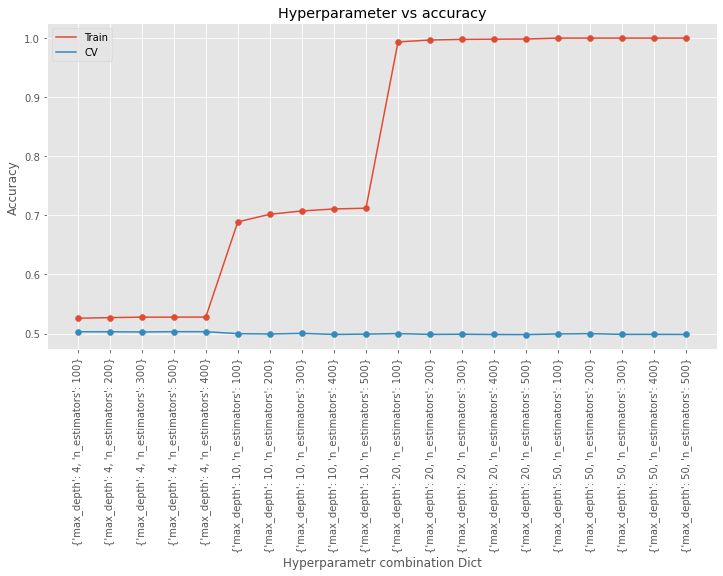

In [196]:
#Random Forest Classifier

# Grid Search To Get Best Hyperparameters
parameters = {'max_depth':[4,10,20,50], 'n_estimators': [100,200,300,400,500]}
clf_rf = RandomForestClassifier(class_weight='balanced', random_state=43)      
grid = GridSearchCV(estimator=clf_rf, param_grid=parameters,scoring='accuracy',return_train_score=True,verbose=1)
grid.fit(x_train,y_train)

print("-----"*20)
cv_result = pd.DataFrame(grid.cv_results_).sort_values(by='mean_train_score',ascending=True)
params = list(cv_result['params'].astype(str))

plt.figure(figsize=(12,6))
plt.scatter(params,cv_result['mean_train_score'])
plt.plot(params,cv_result['mean_train_score'],label='Train')
plt.scatter(params,cv_result['mean_test_score'])
plt.plot(params,cv_result['mean_test_score'],label="CV")
plt.title('Hyperparameter vs accuracy')
plt.legend()
plt.xlabel('Hyperparametr combination Dict')
plt.xticks(rotation=90)
plt.ylabel('Accuracy')
plt.show()

In [200]:
# Best parameter chosen manually by observation that gives the best bias variance trade off
best_max_depth = 10
best_n_estimator = 500

In [213]:
# Training the model again using the optimal parameters discovered
clf_rf = RandomForestClassifier(max_depth=best_max_depth,n_estimators=best_n_estimator,\
                                class_weight='balanced', random_state=43)
clf_rf.fit(x_train,y_train)

result1 = ["1.","RF","Balanced using class weights"]
y_pred_tr = clf_rf.predict(x_train)
result1.append(round(accuracy_score(y_train,y_pred_tr),2))
print('Train accuracy RF: ',result1[3])

y_pred_test = clf_rf.predict(x_test)
result1.append(round(accuracy_score(y_test,y_pred_test),2))
print('Test accuracy RF: ',result1[4])

recall = recall_score(y_test,y_pred_test)
result1.append(round(recall,2))
print("Recall Score: ",result1[5])

Train accuracy RF:  0.7
Test accuracy RF:  0.5
Recall Score:  0.47


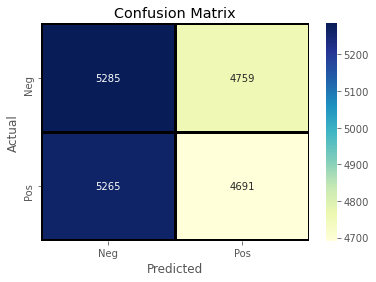

In [202]:
cm = confusion_matrix(y_test,y_pred_test)
ax=plt.subplot();
sns.heatmap(cm, annot=True, fmt='d', linewidths=2, linecolor='black', cmap='YlGnBu',ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_ylim(2.0,0)
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Neg','Pos'])
ax.yaxis.set_ticklabels(['Neg','Pos'])
plt.show()

<b> Observations: </b> 
- The model appears to be overfitting because the test accuracy is substantially lower than the train accuracy. This suggests that the model is memorizing the training data rather than generalizing from it.
- Model could do much better if we can collect more data on the churned class.

In [203]:
#XgBoost Classifier
# create scale_pos_weight parameter used for class balancing in XgBoost
import math
scale=round(math.sqrt(y_train.value_counts()[0]/y_train.value_counts()[1]),2)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
----------------------------------------------------------------------------------------------------


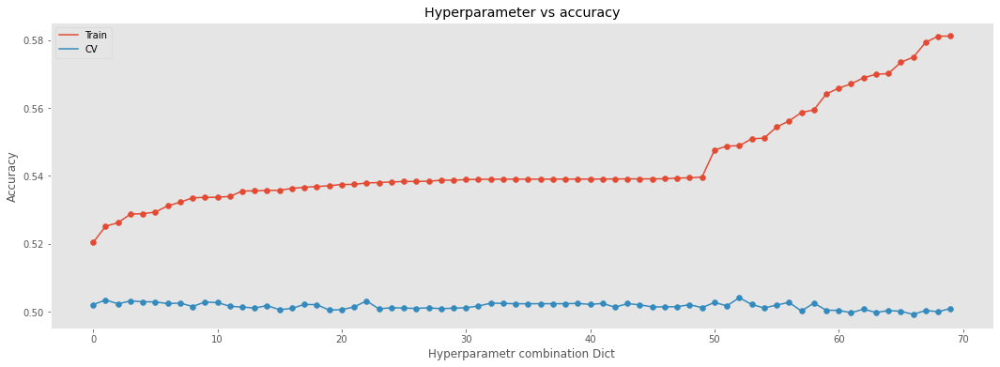

In [207]:
# Grid Search To Get Best Hyperparameters
parameters = {"learning_rate"    : [0.10,0.20,0.30 ],\
              "max_depth"        : [ 3,5,10,20],\
              "n_estimators" : [ 100, 200, 300, 500],\
              "colsample_bytree" : [ 0.3, 0.5, 0.7 ] }
clf_xgb = XGBClassifier(scale_pos_weight=scale, eval_metric='mlogloss')
grid = GridSearchCV(estimator=clf_xgb, param_grid=parameters,scoring='accuracy',return_train_score=True,verbose=1)
grid.fit(x_train,y_train)

print("-----"*20)
# plotting only the first 70 train scores
cv_result = pd.DataFrame(grid.cv_results_).sort_values(by='mean_train_score',ascending=True)[:70]
param_list = list(cv_result['params'])
param_index = np.arange(70)
plt.figure(figsize=(18,6))
plt.scatter(param_index,cv_result['mean_train_score'])
plt.plot(param_index,cv_result['mean_train_score'],label='Train')
plt.scatter(param_index,cv_result['mean_test_score'])
plt.plot(param_index,cv_result['mean_test_score'],label="CV")
plt.title('Hyperparameter vs accuracy')
plt.grid()
plt.legend()
plt.xlabel('Hyperparametr combination Dict')
plt.ylabel('Accuracy')
plt.show()

In [208]:
# Best parameter chosen manually by observation that gives the best bias variance trade off
best_parameters = param_list[52]
print(best_parameters)

{'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}


In [214]:
# Training the model again using the optimal parameters discovered
clf_xgb = XGBClassifier(learning_rate=best_parameters['learning_rate'],max_depth=best_parameters['max_depth'],\
                        n_estimators=best_parameters['n_estimators'], colsample_bytree=best_parameters['colsample_bytree'],\
                        eval_metric='mlogloss',scale_pos_weight=scale)
clf_xgb.fit(x_train,y_train)

result2 = ["2.","XGBClassifier","Balanced using scale_pos_weight"]
y_pred_tr = clf_xgb.predict(x_train)
result2.append(round(accuracy_score(y_train,y_pred_tr),2))
print('Train accuracy XGB: ',result2[3])

y_pred_test = clf_xgb.predict(x_test)
result2.append(round(accuracy_score(y_test,y_pred_test),2))
print('Test accuracy XGB: ',result2[4])

recall = recall_score(y_test,y_pred_test)
result2.append(round(recall,2))
print("Recall Score: ",result2[5])

Train accuracy XGB:  0.54
Test accuracy XGB:  0.5
Recall Score:  0.44


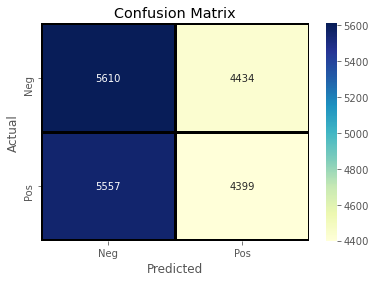

In [212]:
# Visualise confusion matrix
cm = confusion_matrix(y_test,y_pred_test)
ax=plt.subplot();
sns.heatmap(cm, annot=True, fmt='d', linewidths=2, linecolor='black', cmap='YlGnBu',ax=ax)
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
ax.set_ylim(2.0,0)
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Neg','Pos'])
ax.yaxis.set_ticklabels(['Neg','Pos'])
plt.show()

<b>Observation</b>
- The test accuracy is 50%, which is equivalent to random guessing for a binary classification problem. This indicates that the model is not performing significantly better than chance on the test data.
- The recall score of 0.44 suggests that the model is capturing only 44% of the positive instances in the test data

<h3>Conclusion:</h3>

In [219]:
Result_table = PrettyTable(["S.No.","Model","class imbalance status","Train_accuracy","Test_Accuracy","Test_Recall_score"])
Result_table.add_row(result1)
Result_table.add_row(result2)
print(Result_table)

+-------+---------------+---------------------------------+----------------+---------------+-------------------+
| S.No. |     Model     |      class imbalance status     | Train_accuracy | Test_Accuracy | Test_Recall_score |
+-------+---------------+---------------------------------+----------------+---------------+-------------------+
|   1.  |       RF      |   Balanced using class weights  |      0.7       |      0.5      |        0.47       |
|   2.  | XGBClassifier | Balanced using scale_pos_weight |      0.54      |      0.5      |        0.44       |
+-------+---------------+---------------------------------+----------------+---------------+-------------------+


- The challange is reducing the class imbalance while simultaneously getting a high recall score without overfitting. It's achievable by acquiring a larger dataset and doing a more rigorous hyperparameter tuning for the classifier.